In [1]:
from colocate import ui, erddap_query

In [2]:
ui.m

Map(basemap={'url': 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', 'max_zoom': 19, 'attribution': 'Map …

In [3]:
ui.dates

SelectionRangeSlider(description='Starting date', index=(0, 25566), layout=Layout(width='90%'), options=(datet…

In [4]:
ui.drpdwn

Dropdown(description='CF Standard Names:', options=('sea_water_salinity', 'sea_water_temperature', 'mass_conce…

In [5]:
ui.button

Can I haz ERDDAPs???
i: 0
name: CoastWatch West Coast Node
url: https://coastwatch.pfeg.noaa.gov/erddap/
public: True
i: 1
name: ERDDAP at the Asia-Pacific Data-Research Center
url: https://apdrc.soest.hawaii.edu/erddap/
public: True
i: 2
name: NOAA's National Centers for Environmental Information (NCEI)
url: https://www.ncei.noaa.gov/erddap/
public: True
i: 3
name: Biological and Chemical Oceanography Data Management Office (BCO-DMO) ERDDAP
url: https://erddap.bco-dmo.org/erddap/
public: True
i: 4
name: European Marine Observation and Data Network (EMODnet) Physics ERDDAP
url: https://erddap.emodnet-physics.eu/erddap/
public: True
i: 5
name: Marine Institute - Ireland
url: https://erddap.marine.ie/erddap/
public: True
i: 6
name: CoastWatch Caribbean/Gulf of Mexico Node
url: https://cwcgom.aoml.noaa.gov/erddap/
public: True
i: 7
name: NOAA IOOS Sensors ERDDAP
url: http://erddap.sensors.ioos.us/erddap/
public: True
i: 8
name: NOAA IOOS CeNCOOS (Central and Northern California Ocean Obse

In [9]:
ui.kw

{'search_for': 'all',
 'min_lon': -123.77792899999997,
 'max_lon': -119.733003,
 'min_lat': 49.04459,
 'max_lat': 51.26833099999999,
 'min_time': '2015-11-28T00:00:00Z',
 'max_time': '2019-12-31T00:00:00Z',
 'standard_name': 'sea_water_salinity'}

In [10]:
ui.df

,server,Dataset ID,tabledap,Institution,Summary
6,https://salishsea.eos.ubc.ca/erddap,ubcONCTWDP1mV18-01,https://salishsea.eos.ubc.ca/erddap/tabledap/u...,UBC EOAS,"ONC, Strait of Georgia, BC Ferries, Tsawwassen..."
7,https://salishsea.eos.ubc.ca/erddap,ubcONCLSBBLCTD15mV1,https://salishsea.eos.ubc.ca/erddap/tabledap/u...,UBC EOAS,"ONC, Strait of Georgia, Fraser River Delta Low..."
8,https://salishsea.eos.ubc.ca/erddap,ubcONCUSDDLCTD15mV1,https://salishsea.eos.ubc.ca/erddap/tabledap/u...,UBC EOAS,"ONC, Strait of Georgia, Fraser River Delta Upp..."
9,https://salishsea.eos.ubc.ca/erddap,ubcVFPA2ndNarrowsCurrent2sV1,https://salishsea.eos.ubc.ca/erddap/tabledap/u...,UCB EOAS & DFO IOS,"VFPA, Vancouver Harbour, 2nd Narrows Rail Brid..."


In [20]:
list(ui.df['Dataset ID'])

['ubcONCTWDP1mV18-01',
 'ubcONCLSBBLCTD15mV1',
 'ubcONCUSDDLCTD15mV1',
 'ubcVFPA2ndNarrowsCurrent2sV1']

In [11]:
all_coords = erddap_query.get_coordinates(ui.df,ui.kw)

In [33]:
all_coords.head()

,latitude (degrees_north),longitude (degrees_east),dataset_count,dataset_download_url,Dataset ID
0,49.044590,-123.304562,0,https://salishsea.eos.ubc.ca/erddap/tabledap/u...,ubcONCTWDP1mV18-01
1,49.044591,-123.381424,0,https://salishsea.eos.ubc.ca/erddap/tabledap/u...,ubcONCTWDP1mV18-01
2,49.044593,-123.380439,0,https://salishsea.eos.ubc.ca/erddap/tabledap/u...,ubcONCTWDP1mV18-01
3,49.044594,-123.371066,0,https://salishsea.eos.ubc.ca/erddap/tabledap/u...,ubcONCTWDP1mV18-01
4,49.044594,-123.301185,0,https://salishsea.eos.ubc.ca/erddap/tabledap/u...,ubcONCTWDP1mV18-01


In [16]:
all_coords.shape

(532195, 5)

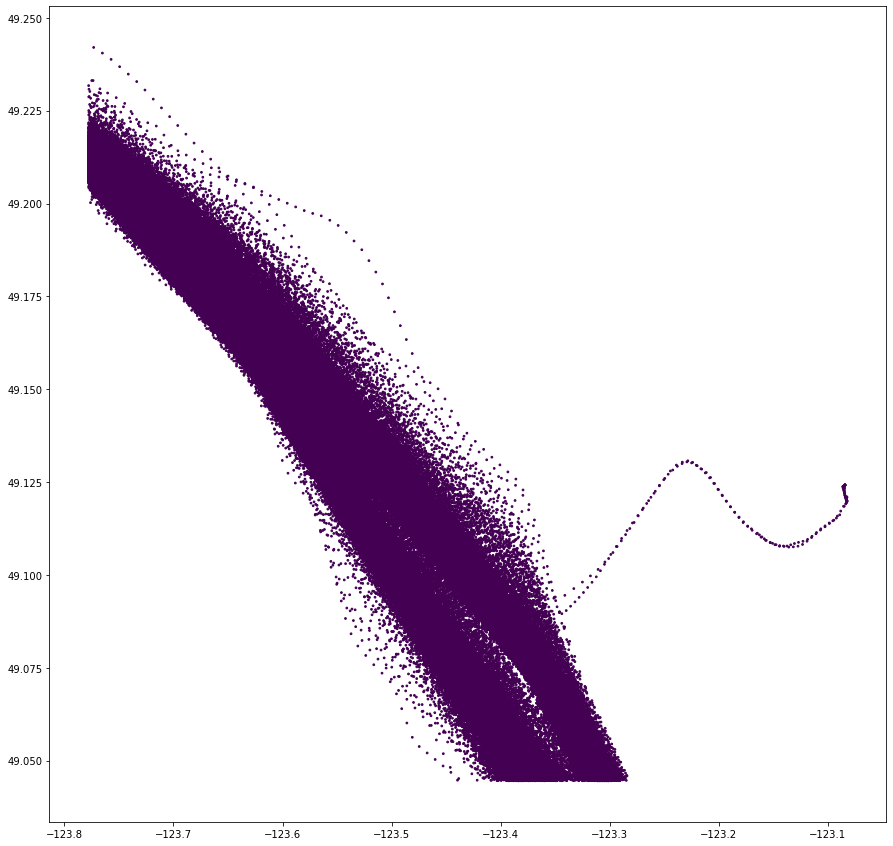

In [25]:
import matplotlib.pyplot as plt
var = 'ubcONCTWDP1mV18-01'
#var = 'ubcONCLSBBLCTD15mV1'

plt.figure(figsize=(15,15))
plt.scatter(all_coords.loc[all_coords['Dataset ID']==var,'longitude (degrees_east)'],
           all_coords.loc[all_coords['Dataset ID']==var,'latitude (degrees_north)'],
           s=3,c=all_coords.loc[all_coords['Dataset ID']==var,'dataset_count'].values)

In [35]:
df_coords = all_coords
import pandas as pd
import hvplot.pandas
import cmocean as cmo
import datashader as ds
import cartopy.crs as ccrs
#import matplotlib.pyplot as plt
import geoviews as gv
import holoviews as hv
#df_coords = pd.read_csv(‘/Users/santanay/code/OHW19/ohw19-project-co_locators/coordinates.zip’, index_col=0)
import cartopy.io.shapereader as shpreader
shpfilename = shpreader.natural_earth(resolution='10m',
                                    category='physical',
                                    name='coastline')
df_coords.hvplot.scatter(
   'longitude (degrees_east)','latitude (degrees_north)', s=5, c='Dataset ID',
   projection=ccrs.PlateCarree(),
   width=600, height=540, cmap=cmo.cm.tempo,
   datashade=True
) * gv.Shape.from_shapefile(shpfilename, crs=ccrs.PlateCarree())

:DynamicMap   []
   :Overlay
      .RGB.I  :RGB   [longitude (degrees_east),latitude (degrees_north)]   (R,G,B,A)
      .Path.I :Path   [Longitude,Latitude]

In [28]:
!conda install hvplot

Solving environment: done

## Package Plan ##

  environment location: /home/mwengren/miniconda3/envs/colocators-ohw19

  added / updated specs:
    - hvplot


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    param-1.9.1                |             py_0          59 KB  conda-forge
    pyviz_comms-0.7.2          |             py_0          12 KB  conda-forge
    ------------------------------------------------------------
                                           Total:          71 KB

The following NEW packages will be INSTALLED:

  holoviews          conda-forge/noarch::holoviews-1.12.5-py_0
  hvplot             conda-forge/noarch::hvplot-0.4.0-py_1
  param              conda-forge/noarch::param-1.9.1-py_0
  pyviz_comms        conda-forge/noarch::pyviz_comms-0.7.2-py_0


Proceed ([y]/n)? ^C

CondaSystemExit: 
Operation aborted.  Exiting.



In [ ]:
y